In [1]:
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv("data/credit card.csv")
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [3]:
df.shape

(30000, 25)

In [4]:
df.isnull().sum()

ID                            0
LIMIT_BAL                     0
SEX                           0
EDUCATION                     0
MARRIAGE                      0
AGE                           0
PAY_0                         0
PAY_2                         0
PAY_3                         0
PAY_4                         0
PAY_5                         0
PAY_6                         0
BILL_AMT1                     0
BILL_AMT2                     0
BILL_AMT3                     0
BILL_AMT4                     0
BILL_AMT5                     0
BILL_AMT6                     0
PAY_AMT1                      0
PAY_AMT2                      0
PAY_AMT3                      0
PAY_AMT4                      0
PAY_AMT5                      0
PAY_AMT6                      0
default.payment.next.month    0
dtype: int64

In [5]:
df.nunique()

ID                            30000
LIMIT_BAL                        81
SEX                               2
EDUCATION                         7
MARRIAGE                          4
AGE                              56
PAY_0                            11
PAY_2                            11
PAY_3                            11
PAY_4                            11
PAY_5                            10
PAY_6                            10
BILL_AMT1                     22723
BILL_AMT2                     22346
BILL_AMT3                     22026
BILL_AMT4                     21548
BILL_AMT5                     21010
BILL_AMT6                     20604
PAY_AMT1                       7943
PAY_AMT2                       7899
PAY_AMT3                       7518
PAY_AMT4                       6937
PAY_AMT5                       6897
PAY_AMT6                       6939
default.payment.next.month        2
dtype: int64

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          30000 non-null  int64  
 1   LIMIT_BAL                   30000 non-null  float64
 2   SEX                         30000 non-null  int64  
 3   EDUCATION                   30000 non-null  int64  
 4   MARRIAGE                    30000 non-null  int64  
 5   AGE                         30000 non-null  int64  
 6   PAY_0                       30000 non-null  int64  
 7   PAY_2                       30000 non-null  int64  
 8   PAY_3                       30000 non-null  int64  
 9   PAY_4                       30000 non-null  int64  
 10  PAY_5                       30000 non-null  int64  
 11  PAY_6                       30000 non-null  int64  
 12  BILL_AMT1                   30000 non-null  float64
 13  BILL_AMT2                   300

In [7]:
df = df.rename(columns={'default.payment.next.month':'payment'})

In [8]:
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,payment
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [9]:
x = df.drop(['ID','payment'], axis=1)

In [10]:
y = df[['payment']]

In [11]:
y.value_counts()

payment
0          23364
1           6636
dtype: int64

In [12]:
23364 / (23364+6636)

0.7788

# Wrapper Method - Recursive Feature Elimination (RFE) in Python

Wrapper methods in feature selection involve evaluating different subsets of features by training and evaluating a machine learning model. You can perform wrapper feature selection using a simple wrapper method called Recursive Feature Elimination (RFE) in Python

In [13]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

In [14]:
# Create an instance of the classifier
classifier = LogisticRegression()

In [15]:
# Create an instance of Recursive Feature Elimination with logistic regression
rfe = RFE(estimator=classifier, n_features_to_select=10)

# Fit RFE to your data

In [16]:
rfe.fit(x, y)  

RFE(estimator=LogisticRegression(), n_features_to_select=10)

In [17]:
# Print the selected features
selected_features = rfe.support_
feature_ranks = rfe.ranking_

In [18]:
feature_ranks

array([ 9,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  6, 14,  7,  8, 13, 11,
        2,  3,  5,  4, 10, 12])

In [19]:
# Print the selected features and their ranks
for feature, rank in zip(x.columns, feature_ranks):
    print(f'Feature: {feature}, Rank: {rank}')

Feature: LIMIT_BAL, Rank: 9
Feature: SEX, Rank: 1
Feature: EDUCATION, Rank: 1
Feature: MARRIAGE, Rank: 1
Feature: AGE, Rank: 1
Feature: PAY_0, Rank: 1
Feature: PAY_2, Rank: 1
Feature: PAY_3, Rank: 1
Feature: PAY_4, Rank: 1
Feature: PAY_5, Rank: 1
Feature: PAY_6, Rank: 1
Feature: BILL_AMT1, Rank: 6
Feature: BILL_AMT2, Rank: 14
Feature: BILL_AMT3, Rank: 7
Feature: BILL_AMT4, Rank: 8
Feature: BILL_AMT5, Rank: 13
Feature: BILL_AMT6, Rank: 11
Feature: PAY_AMT1, Rank: 2
Feature: PAY_AMT2, Rank: 3
Feature: PAY_AMT3, Rank: 5
Feature: PAY_AMT4, Rank: 4
Feature: PAY_AMT5, Rank: 10
Feature: PAY_AMT6, Rank: 12


In [20]:
rfe.score(x,y)

0.8099333333333333

# Embedded Methods - L1 regularization (Lasso)

In [21]:
# Create an instance of the classifier with L1 regularization (Lasso)
#https://towardsdatascience.com/l1-and-l2-regularization-methods-ce25e7fc831c

classifier = LogisticRegression(penalty='l1', solver='liblinear')

# Fit the classifier to your data
classifier.fit(x, y)  # x/X_train: Input features, y/y_train: Target variable

# Retrieve the coefficients (weights) of the features
coefficients = classifier.coef_


In [22]:
# Print the coefficients and corresponding feature names
for feature, coefficient in zip(x.columns, coefficients[0]):
    print(f'Feature: {feature}, Coefficient: {coefficient}')

Feature: LIMIT_BAL, Coefficient: -7.666382521605672e-07
Feature: SEX, Coefficient: -0.11016622831570201
Feature: EDUCATION, Coefficient: -0.10202047869987739
Feature: MARRIAGE, Coefficient: -0.15683972290133158
Feature: AGE, Coefficient: 0.007239879156903136
Feature: PAY_0, Coefficient: 0.5771441241946208
Feature: PAY_2, Coefficient: 0.08268048253357306
Feature: PAY_3, Coefficient: 0.07210661205795633
Feature: PAY_4, Coefficient: 0.023849547826831012
Feature: PAY_5, Coefficient: 0.03396596364493126
Feature: PAY_6, Coefficient: 0.00800008075493074
Feature: BILL_AMT1, Coefficient: -5.451770757337575e-06
Feature: BILL_AMT2, Coefficient: 2.2888221882673245e-06
Feature: BILL_AMT3, Coefficient: 1.3946791765646305e-06
Feature: BILL_AMT4, Coefficient: -1.7899006303024803e-07
Feature: BILL_AMT5, Coefficient: 6.058739435630782e-07
Feature: BILL_AMT6, Coefficient: 4.0036010629386493e-07
Feature: PAY_AMT1, Coefficient: -1.3598636466948643e-05
Feature: PAY_AMT2, Coefficient: -9.652827104374999e-06


# Filter Methods - Extra Trees Classifier

In [23]:
from sklearn.ensemble import ExtraTreesClassifier # Decison tree

In [24]:
extr = ExtraTreesClassifier()

In [25]:
extr.fit(x,y)

ExtraTreesClassifier()

In [26]:
extr.feature_importances_ # IG from decision tree

array([0.06609476, 0.01269634, 0.03340087, 0.02181344, 0.06655828,
       0.09522723, 0.05118163, 0.03150775, 0.02940476, 0.02859105,
       0.03096597, 0.05016308, 0.04714181, 0.04500152, 0.04473067,
       0.04320536, 0.04430711, 0.04361247, 0.04260317, 0.04177293,
       0.04085509, 0.04297898, 0.04618573])

In [27]:
feature_importance = extr.feature_importances_
feature_importance #info gain

array([0.06609476, 0.01269634, 0.03340087, 0.02181344, 0.06655828,
       0.09522723, 0.05118163, 0.03150775, 0.02940476, 0.02859105,
       0.03096597, 0.05016308, 0.04714181, 0.04500152, 0.04473067,
       0.04320536, 0.04430711, 0.04361247, 0.04260317, 0.04177293,
       0.04085509, 0.04297898, 0.04618573])

In [28]:
imp = pd.DataFrame(feature_importance, columns=['Gain_Score'])
imp

,Gain_Score
0,0.066095
1,0.012696
2,0.033401
3,0.021813
4,0.066558
5,0.095227
6,0.051182
7,0.031508
8,0.029405
9,0.028591


In [29]:
x.columns

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6'],
      dtype='object')

In [30]:
cols = pd.DataFrame(x.columns, columns=['Feature_Names'])
cols

,Feature_Names
0,LIMIT_BAL
1,SEX
2,EDUCATION
3,MARRIAGE
4,AGE
5,PAY_0
6,PAY_2
7,PAY_3
8,PAY_4
9,PAY_5


In [31]:
gains = pd.concat([cols,imp],axis=1)
gains

,Feature_Names,Gain_Score
0,LIMIT_BAL,0.066095
1,SEX,0.012696
2,EDUCATION,0.033401
3,MARRIAGE,0.021813
4,AGE,0.066558
5,PAY_0,0.095227
6,PAY_2,0.051182
7,PAY_3,0.031508
8,PAY_4,0.029405
9,PAY_5,0.028591


In [32]:
gains.nlargest(15,'Gain_Score') #smallest()

,Feature_Names,Gain_Score
5,PAY_0,0.095227
4,AGE,0.066558
0,LIMIT_BAL,0.066095
6,PAY_2,0.051182
11,BILL_AMT1,0.050163
12,BILL_AMT2,0.047142
22,PAY_AMT6,0.046186
13,BILL_AMT3,0.045002
14,BILL_AMT4,0.044731
16,BILL_AMT6,0.044307


In [33]:
gains.nsmallest(8,'Gain_Score')

,Feature_Names,Gain_Score
1,SEX,0.012696
3,MARRIAGE,0.021813
9,PAY_5,0.028591
8,PAY_4,0.029405
10,PAY_6,0.030966
7,PAY_3,0.031508
2,EDUCATION,0.033401
20,PAY_AMT4,0.040855


<AxesSubplot:>

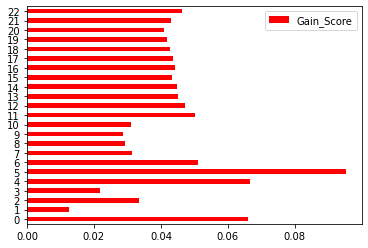

In [34]:
gains.plot(kind='barh',color=['red']) # barh mean horizontal

In [35]:
x.shape

(30000, 23)

In [36]:
import matplotlib.pyplot as plt

<AxesSubplot:>

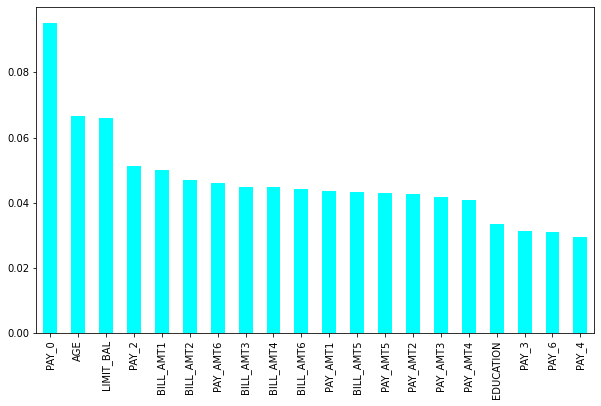

In [37]:
features = pd.Series(extr.feature_importances_, index = x.columns)
plt.figure(figsize=(10,6))
features.nlargest(20).plot(kind='bar', color='cyan')
#plt.savefig('score1.png')

In [38]:
import seaborn as sns

<AxesSubplot:>

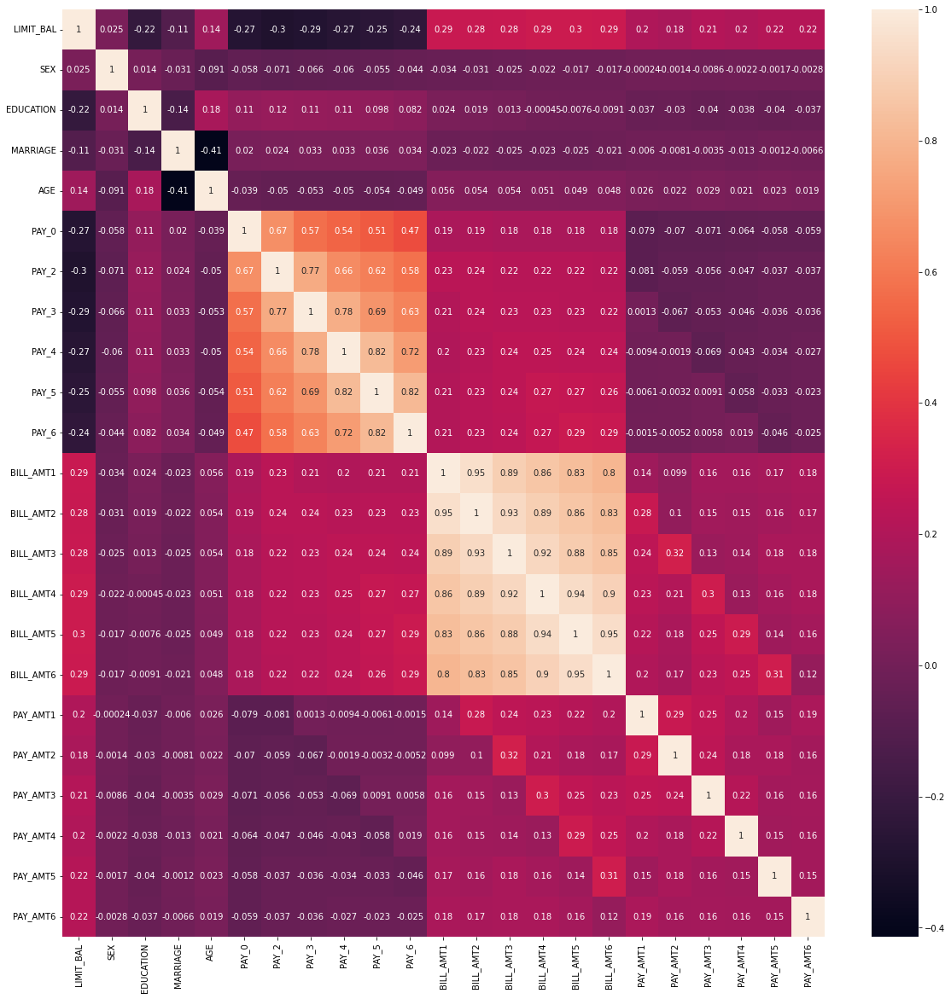

In [39]:
feature_names = x.columns #features name 
colname = x.corr().index #features name 
plt.figure(figsize=(20,20))
sns.heatmap(df[colname].corr(),annot=True)

# Select K Best

In [40]:
df = pd.read_csv("credit card.csv")  
df = df.rename(columns={'default.payment.next.month':'payment'})  
x = df.drop(['ID','payment'], axis=1)
y = df['payment']

FileNotFoundError: [Errno 2] No such file or directory: 'credit card.csv'

In [41]:
x.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,20000.0,2,2,1,24,2,2,-1,-1,-2,...,689.0,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0
1,120000.0,2,2,2,26,-1,2,0,0,0,...,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0
2,90000.0,2,2,2,34,0,0,0,0,0,...,13559.0,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0
3,50000.0,2,2,1,37,0,0,0,0,0,...,49291.0,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0
4,50000.0,1,2,1,57,-1,0,-1,0,0,...,35835.0,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0


In [42]:
from sklearn.feature_selection import SelectKBest, f_classif, chi2, f_regression #chi2 only when features are non negative

In [43]:
model2 = SelectKBest(score_func=f_classif)

In [44]:
feature_score = model2.fit(x,y)

In [45]:
feature_score.scores_

array([7.24068539e+02, 4.79788543e+01, 2.35471118e+01, 1.77812714e+01,
       5.78855582e+00, 3.53771497e+03, 2.23916914e+03, 1.75746644e+03,
       1.47684597e+03, 1.30459118e+03, 1.08540249e+03, 1.15805315e+01,
       6.04423789e+00, 5.94438771e+00, 3.09474518e+00, 1.37108740e+00,
       8.65820292e-01, 1.60403810e+02, 1.03291524e+02, 9.52180109e+01,
       9.71880005e+01, 9.14298008e+01, 8.50890453e+01])

In [46]:
cols = pd.DataFrame(feature_score.scores_ , columns=['Feature_Scores'])
cols

,Feature_Scores
0,724.068539
1,47.978854
2,23.547112
3,17.781271
4,5.788556
5,3537.714970
6,2239.169136
7,1757.466444
8,1476.845967
9,1304.591176


In [47]:
x.columns

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6'],
      dtype='object')

In [48]:
col2 = pd.DataFrame(x.columns, columns=['Feature_Names'])
col2.head()

,Feature_Names
0,LIMIT_BAL
1,SEX
2,EDUCATION
3,MARRIAGE
4,AGE


In [49]:
scores = pd.concat([col2,cols],axis=1)
scores

,Feature_Names,Feature_Scores
0,LIMIT_BAL,724.068539
1,SEX,47.978854
2,EDUCATION,23.547112
3,MARRIAGE,17.781271
4,AGE,5.788556
5,PAY_0,3537.714970
6,PAY_2,2239.169136
7,PAY_3,1757.466444
8,PAY_4,1476.845967
9,PAY_5,1304.591176


In [50]:
scores.nlargest(15,'Feature_Scores')

,Feature_Names,Feature_Scores
5,PAY_0,3537.714970
6,PAY_2,2239.169136
7,PAY_3,1757.466444
8,PAY_4,1476.845967
9,PAY_5,1304.591176
10,PAY_6,1085.402485
0,LIMIT_BAL,724.068539
17,PAY_AMT1,160.403810
18,PAY_AMT2,103.291524
20,PAY_AMT4,97.188000


In [51]:
#drop the columns

In [52]:
#save
df.to_csv('new.csv')

In [53]:
scores = pd.concat([col2,cols],axis=1)
scores

,Feature_Names,Feature_Scores
0,LIMIT_BAL,724.068539
1,SEX,47.978854
2,EDUCATION,23.547112
3,MARRIAGE,17.781271
4,AGE,5.788556
5,PAY_0,3537.714970
6,PAY_2,2239.169136
7,PAY_3,1757.466444
8,PAY_4,1476.845967
9,PAY_5,1304.591176


In [54]:
newx = scores.nlargest(15,'Feature_Scores')
newx

,Feature_Names,Feature_Scores
5,PAY_0,3537.714970
6,PAY_2,2239.169136
7,PAY_3,1757.466444
8,PAY_4,1476.845967
9,PAY_5,1304.591176
10,PAY_6,1085.402485
0,LIMIT_BAL,724.068539
17,PAY_AMT1,160.403810
18,PAY_AMT2,103.291524
20,PAY_AMT4,97.188000


# PCA

In [57]:
import pandas as pd
df = pd.read_csv("data/credit card.csv")
df = df.rename(columns={'default.payment.next.month':'payment'})
x = df.drop(['ID','payment'],axis=1)
y = df['payment']

In [58]:
x

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,20000.0,2,2,1,24,2,2,-1,-1,-2,...,689.0,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0
1,120000.0,2,2,2,26,-1,2,0,0,0,...,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0
2,90000.0,2,2,2,34,0,0,0,0,0,...,13559.0,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0
3,50000.0,2,2,1,37,0,0,0,0,0,...,49291.0,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0
4,50000.0,1,2,1,57,-1,0,-1,0,0,...,35835.0,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,220000.0,1,3,1,39,0,0,0,0,0,...,208365.0,88004.0,31237.0,15980.0,8500.0,20000.0,5003.0,3047.0,5000.0,1000.0
29996,150000.0,1,3,2,43,-1,-1,-1,-1,0,...,3502.0,8979.0,5190.0,0.0,1837.0,3526.0,8998.0,129.0,0.0,0.0
29997,30000.0,1,2,2,37,4,3,2,-1,0,...,2758.0,20878.0,20582.0,19357.0,0.0,0.0,22000.0,4200.0,2000.0,3100.0
29998,80000.0,1,3,1,41,1,-1,0,0,0,...,76304.0,52774.0,11855.0,48944.0,85900.0,3409.0,1178.0,1926.0,52964.0,1804.0


In [59]:
#FEATURE SCALING 
from sklearn.preprocessing import MinMaxScaler  #SandardScaler()

In [60]:
mmx = MinMaxScaler() #feature_range=(2,5)

In [61]:
scaled_x = mmx.fit_transform(x)

In [62]:
scaled_x.shape

(30000, 23)

In [63]:
scaled_x

array([[0.01010101, 1.        , 0.33333333, ..., 0.        , 0.        ,
        0.        ],
       [0.11111111, 1.        , 0.33333333, ..., 0.00161031, 0.        ,
        0.00378311],
       [0.08080808, 1.        , 0.33333333, ..., 0.00161031, 0.00234451,
        0.00945777],
       ...,
       [0.02020202, 0.        , 0.33333333, ..., 0.00676329, 0.00468901,
        0.00586382],
       [0.07070707, 0.        , 0.5       , ..., 0.00310145, 0.12417444,
        0.00341236],
       [0.04040404, 0.        , 0.33333333, ..., 0.00161031, 0.00234451,
        0.00189155]])

In [64]:
from sklearn.decomposition import PCA

In [65]:
pca = PCA(n_components=3)
x_pca = pca.fit_transform(scaled_x)

In [66]:
x_pca

array([[-0.40423245, -0.00800476, -0.00259672],
       [-0.39188881,  0.20922401, -0.19698759],
       [-0.39264215,  0.08409527, -0.12656657],
       ...,
       [ 0.62351265,  0.33728836, -0.08489178],
       [ 0.60374479, -0.01953156,  0.214211  ],
       [ 0.60917214,  0.0099741 ,  0.23321988]])

In [67]:
features = pd.DataFrame(x_pca, columns=['pca1','pca2','pca3'])

In [68]:
features

,pca1,pca2,pca3
0,-0.404232,-0.008005,-0.002597
1,-0.391889,0.209224,-0.196988
2,-0.392642,0.084095,-0.126567
3,-0.394038,0.068885,0.154030
4,0.610813,-0.089679,0.334445
...,...,...,...
29995,0.605245,0.027127,0.231678
29996,0.601275,-0.132858,-0.028314
29997,0.623513,0.337288,-0.084892
29998,0.603745,-0.019532,0.214211


In [69]:
import plotly.express as pl
pl.scatter_3d(features, x='pca1',y='pca2',z='pca3', color='pca1')

In [70]:
from sklearn.model_selection import train_test_split as tts 

In [71]:
xtrain,xtest, ytrain,ytest = tts(features,y,test_size=.30,  random_state=1) 

In [72]:
xtrain 

,pca1,pca2,pca3
4936,0.588201,-0.220413,-0.321038
4788,0.616076,0.062374,0.319937
8447,-0.396698,0.103833,-0.210450
4535,0.588418,-0.368499,-0.139352
27563,0.619138,0.027233,0.115131
...,...,...,...
17289,-0.387321,0.169520,0.248251
5192,-0.413089,-0.415968,0.140726
12172,0.599752,0.071849,-0.267975
235,0.595272,-0.211586,-0.193925


In [73]:
from sklearn.linear_model import LogisticRegression 
clf=LogisticRegression()

In [74]:
clf.fit(xtrain,ytrain)

LogisticRegression()

In [75]:
clf.score(xtest, ytest) #testing

0.7962222222222223

In [76]:
clf.score(xtrain, ytrain) #training

0.7938571428571428

In [77]:
y.value_counts()

0    23364
1     6636
Name: payment, dtype: int64

In [78]:
x.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,20000.0,2,2,1,24,2,2,-1,-1,-2,...,689.0,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0
1,120000.0,2,2,2,26,-1,2,0,0,0,...,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0
2,90000.0,2,2,2,34,0,0,0,0,0,...,13559.0,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0
3,50000.0,2,2,1,37,0,0,0,0,0,...,49291.0,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0
4,50000.0,1,2,1,57,-1,0,-1,0,0,...,35835.0,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0


# Before

In [79]:
x.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,20000.0,2,2,1,24,2,2,-1,-1,-2,...,689.0,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0
1,120000.0,2,2,2,26,-1,2,0,0,0,...,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0
2,90000.0,2,2,2,34,0,0,0,0,0,...,13559.0,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0
3,50000.0,2,2,1,37,0,0,0,0,0,...,49291.0,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0
4,50000.0,1,2,1,57,-1,0,-1,0,0,...,35835.0,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0


In [80]:
xtrain1,xtest2, ytrain1, ytest1 = tts(x,y,test_size=.30, random_state=1)

In [81]:
xtrain1.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
4936,20000.0,1,1,2,24,-1,-1,-1,-1,-1,...,390.0,780.0,0.0,0.0,390.0,390.0,780.0,0.0,0.0,0.0
4788,120000.0,1,2,1,52,2,0,0,0,0,...,105262.0,46605.0,45590.0,46204.0,4449.0,2731.0,3000.0,5000.0,3000.0,3000.0
8447,70000.0,2,2,2,26,0,0,0,0,0,...,26103.0,28342.0,24894.0,25272.0,3003.0,5106.0,4026.0,755.0,1029.0,5303.0
4535,230000.0,1,2,2,37,1,-2,-2,-2,-2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
27563,130000.0,1,2,2,56,0,0,0,0,0,...,111780.0,116357.0,96936.0,98173.0,4000.0,5000.0,8000.0,4000.0,4000.0,5000.0


In [82]:
clf.fit(xtrain1,ytrain1)

LogisticRegression()

In [83]:
clf.score(xtest2, ytest1)

0.7777777777777778

In [84]:
clf.score(xtrain1,ytrain1)

0.7791904761904762